In [7]:
import tensorflow as tf
print("TensorFlow version:", tf.__version__)


TensorFlow version: 2.18.0


In [8]:
import os

dataset_path = r"C:\Users\prath\Desktop\dl proj\Project\scientificProject\UCMerced_LandUse"  

images_path = os.path.join(dataset_path, 'Images')
print(f"Images path: {images_path}")
classes = os.listdir(images_path)

for cls in classes:
    class_path = os.path.join(dataset_path, 'Images', cls)
    image_count = len(os.listdir(class_path))
    print(f"Class '{cls}' has {image_count} images.")


Images path: C:\Users\prath\Desktop\dl proj\Project\scientificProject\UCMerced_LandUse\Images
Class 'agricultural' has 100 images.
Class 'airplane' has 100 images.
Class 'baseballdiamond' has 100 images.
Class 'beach' has 100 images.
Class 'buildings' has 100 images.
Class 'chaparral' has 100 images.
Class 'denseresidential' has 100 images.
Class 'forest' has 100 images.
Class 'freeway' has 100 images.
Class 'golfcourse' has 100 images.
Class 'harbor' has 100 images.
Class 'intersection' has 100 images.
Class 'mediumresidential' has 100 images.
Class 'mobilehomepark' has 100 images.
Class 'overpass' has 100 images.
Class 'parkinglot' has 100 images.
Class 'river' has 100 images.
Class 'runway' has 100 images.
Class 'sparseresidential' has 100 images.
Class 'storagetanks' has 100 images.
Class 'tenniscourt' has 100 images.


In [9]:
import cv2
print(cv2.__version__)

4.10.0


Resizing images 

In [ ]:
from PIL import Image
import os

image_dir = os.path.join(dataset_path, 'Images')  
target_size = (256, 256)

non_conforming_count = 0
total_images_checked = 0
non_conforming_images = []  

for cls in classes:  
    class_path = os.path.join(image_dir, cls)

    for image_name in os.listdir(class_path):
        image_path = os.path.join(class_path, image_name)
        total_images_checked += 1

        try:
            with Image.open(image_path) as img:
                if img.size != target_size:
                    non_conforming_count += 1
                    non_conforming_images.append(image_path)

                    resized_img = img.resize(target_size)
                    resized_img.save(image_path)
        except Exception as e:
            print(f"Error processing {image_path}: {e}")

# Summary of results
print(f"Total images checked: {total_images_checked}")
print(f"Images resized to {target_size}: {non_conforming_count}")
if non_conforming_count > 0:
    print("List of resized images:")
    for img_path in non_conforming_images:
        print(img_path)
else:
    print("All images were already of size 256x256.")



Random image from each Class

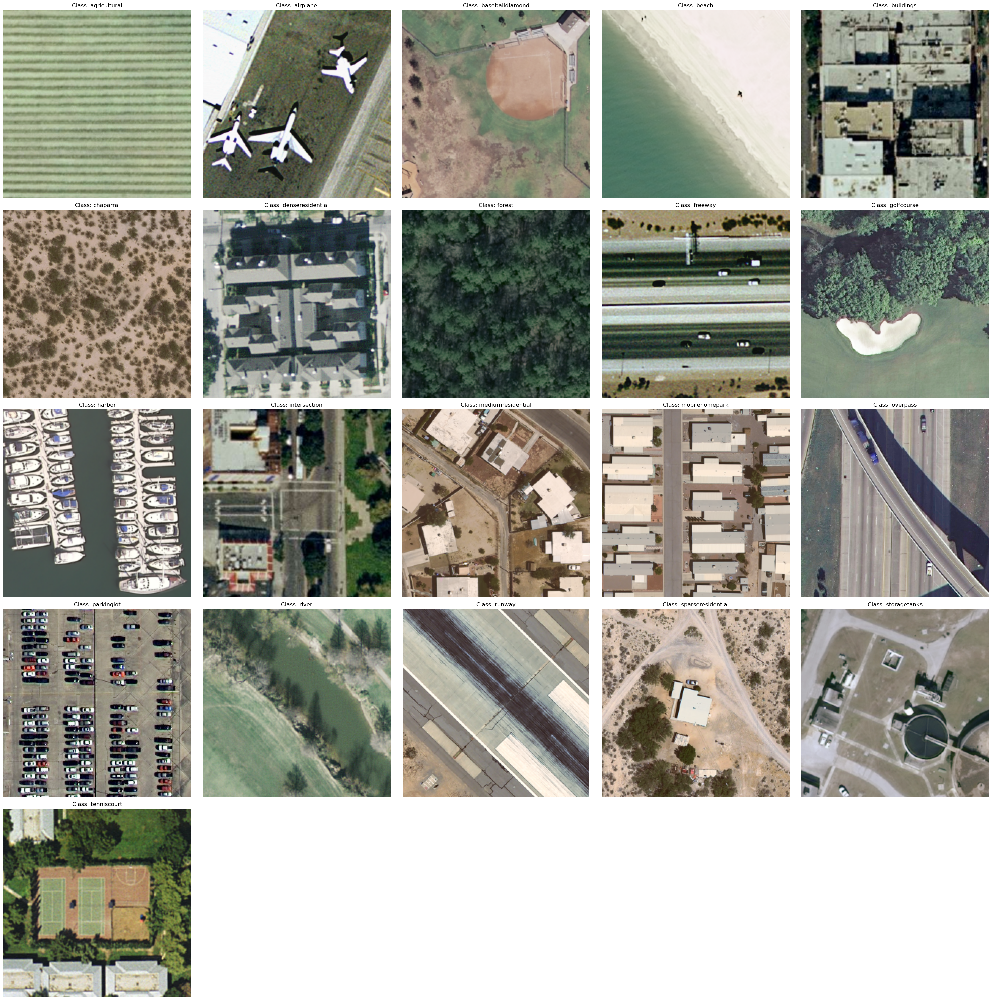

In [11]:
import random
import matplotlib.pyplot as plt
plt.figure(figsize=(30,30))
for i, cls in enumerate(classes):
    class_path = os.path.join(images_path, cls)
    image_files = os.listdir(class_path)

    image_path = os.path.join(class_path, random.choice(image_files))  
    img = cv2.imread(image_path)  
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  

    # Plot the image
    plt.subplot(len(classes)//5 + 1, 5, i+1)  
    plt.imshow(img)
    plt.title(f"Class: {cls}")
    plt.axis('off')  
plt.tight_layout()
plt.show()

Splitting dataset into train,cv,test

In [ ]:
import os
import shutil
import numpy as np
from skimage.io import imread, imsave

# Split sizes(70|15|15)
train_data_size = 70
validate_data_size = 15
test_data_size = 15

dataset_path = r'C:\Users\prath\Desktop\dl proj\Project\scientificProject\UCMerced_LandUse'  

def complement(a, b):
    complement_files = []
    for x in a:
        x = os.path.splitext(x)[0] + '.tif'
        if x not in b:
            complement_files.append(x)
    return complement_files

labels = os.listdir(os.path.join(dataset_path, 'Images'))

for j in labels:
    path = os.path.join(dataset_path, 'Images', j) 
    path1_train = os.path.join(dataset_path, 'data', 'train', j)
    path1_validate = os.path.join(dataset_path, 'data', 'validation', j)
    path1_test = os.path.join(dataset_path, 'data', 'test', j)

 
    try:
        
        if os.path.exists(path1_train): shutil.rmtree(path1_train)
        os.makedirs(path1_train)

        if os.path.exists(path1_validate): shutil.rmtree(path1_validate)
        os.makedirs(path1_validate)

        if os.path.exists(path1_test): shutil.rmtree(path1_test)
        os.makedirs(path1_test)
    except Exception as e:
        print(f"Error creating directories: {e}")
        os.makedirs(path1_train, exist_ok=True)
        os.makedirs(path1_validate, exist_ok=True)
        os.makedirs(path1_test, exist_ok=True)

   
    files1 = os.listdir(path)
    files1 = np.random.permutation(files1) 

    for i in range(train_data_size):
        file = os.path.join(path, files1[i])
        img1 = imread(file)
        file_name = os.path.splitext(files1[i])[0]
        dest_path = os.path.join(path1_train, file_name + '.png')
        imsave(dest_path, img1)

    print(f"{path1_train} - {len(os.listdir(path1_train))} images")

    validate_data0 = complement(files1, os.listdir(path1_train))
    validate_data = np.random.permutation(validate_data0)
    for i in range(validate_data_size):
        file = os.path.join(path, validate_data[i])
        img1 = imread(file)
        file_name = os.path.splitext(validate_data[i])[0]
        dest_path = os.path.join(path1_validate, file_name + '.png')
        imsave(dest_path, img1)

    print(f"{path1_validate} - {len(os.listdir(path1_validate))} images")

    test_data0 = complement(validate_data0, os.listdir(path1_validate))
    test_data = np.random.permutation(test_data0)
    for i in range(test_data_size):
        file = os.path.join(path, test_data[i])
        img1 = imread(file)
        file_name = os.path.splitext(test_data[i])[0]
        dest_path = os.path.join(path1_test, file_name + '.png')
        imsave(dest_path, img1)

    print(f"{path1_test} - {len(os.listdir(path1_test))} images")


Preprocessing Image for Training

In [13]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import numpy as np


base_directory = r'C:\Users\prath\Desktop\dl proj\Project\scientificProject\UCMerced_LandUse'
train_dir = os.path.join(base_directory, 'data', 'train')
validation_dir = os.path.join(base_directory, 'data', 'validation')
test_dir = os.path.join(base_directory, 'data', 'test')

train_datagen = ImageDataGenerator(
    rescale=1.0 / 255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=32,
    color_mode='rgb',
    class_mode='categorical'
)

# Validation data generator (only rescaling)
validation_datagen = ImageDataGenerator(rescale=1.0 / 255)
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(150, 150),
    batch_size=32,
    color_mode='rgb',
    class_mode='categorical'
)

# Test data generator (only rescaling)
test_datagen = ImageDataGenerator(rescale=1.0 / 255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=1,  # One image at a time
    color_mode='rgb',
    class_mode='categorical',
    shuffle=False  # Preserve order for test evaluation
)

X_test = []
y_test = []
for i in range(len(test_generator)):
    x, y = test_generator[i]
    X_test.append(x[0])  
    y_test.append(y[0])  

X_test = np.array(X_test)  
y_test = np.array(y_test)  

y_test_class = np.argmax(y_test, axis=1)

class_label = {v: k for k, v in test_generator.class_indices.items()}

print(f"X_test shape: {X_test.shape}")
print(f"y_test shape: {y_test.shape}")
print(f"Class label mapping: {class_label}")


Found 1474 images belonging to 21 classes.
Found 315 images belonging to 21 classes.
Found 315 images belonging to 21 classes.
X_test shape: (315, 150, 150, 3)
y_test shape: (315, 21)
Class label mapping: {0: 'agricultural', 1: 'airplane', 2: 'baseballdiamond', 3: 'beach', 4: 'buildings', 5: 'chaparral', 6: 'denseresidential', 7: 'forest', 8: 'freeway', 9: 'golfcourse', 10: 'harbor', 11: 'intersection', 12: 'mediumresidential', 13: 'mobilehomepark', 14: 'overpass', 15: 'parkinglot', 16: 'river', 17: 'runway', 18: 'sparseresidential', 19: 'storagetanks', 20: 'tenniscourt'}


Baseline Model - CNN

In [8]:
import os
from skimage.io import imread, imsave
import shutil
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, classification_report
import cv2
import matplotlib.pyplot as plt

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import ModelCheckpoint

model = Sequential([
    Conv2D(32, kernel_size=(3, 3), activation='relu', input_shape=(150, 150, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(32, kernel_size=(3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Dropout(0.25),
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(21, activation='softmax')
])

model.compile(
    loss='categorical_crossentropy',
    optimizer='adam',
    metrics=['accuracy']
)

model.summary()

checkpoint = ModelCheckpoint(
    'best_model.keras',          
    monitor='val_accuracy',      
    mode='max',                  
    save_best_only=True,        
    verbose=1                    
)

history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=100,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // validation_generator.batch_size,
    callbacks=[checkpoint]
)


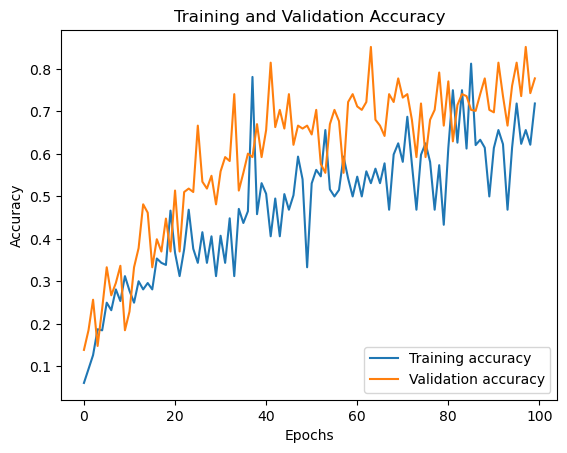

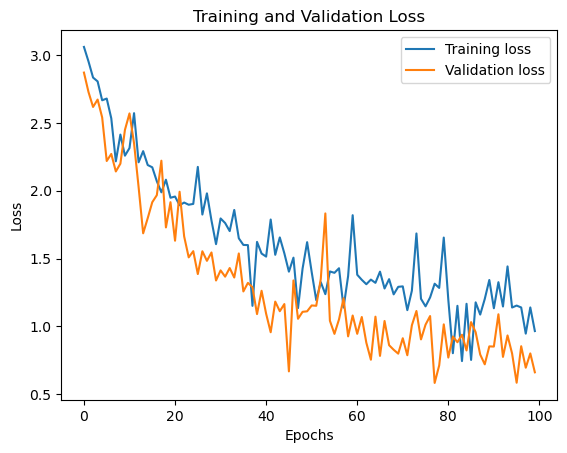

In [14]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(acc, label='Training accuracy')
plt.plot(val_acc, label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.figure()  
plt.plot(loss, label='Training loss')
plt.plot(val_loss, label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


Evaluating CNN performance on test set

In [15]:
model = tf.keras.models.load_model("best_model.keras")

accuracy = model.evaluate(test_generator)

315/315 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - accuracy: 0.8040 - loss: 0.7043


In [16]:
from sklearn.metrics import classification_report

y_pred = model.predict(X_test)

y_pred_class = [np.argmax(y) for y in y_pred]

print(classification_report(y_test_class, y_pred_class))


10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
              precision    recall  f1-score   support

           0       0.86      0.80      0.83        15
           1       0.83      1.00      0.91        15
           2       0.72      0.87      0.79        15
           3       0.94      1.00      0.97        15
           4       0.73      0.53      0.62        15
           5       0.83      1.00      0.91        15
           6       0.57      0.53      0.55        15
           7       0.76      0.87      0.81        15
           8       0.86      0.40      0.55        15
           9       0.59      0.67      0.62        15
          10       1.00      0.93      0.97        15
          11       0.50      0.93      0.65        15
          12       0.43      0.40      0.41        15
          13       0.76      0.87      0.81        15
          14       0.81      0.87      0.84        15
          15       0.70      0.93      0.80        15
          16       0.73      0.53      0.

Confusion Matrix

10/10 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


<Figure size 640x480 with 0 Axes>

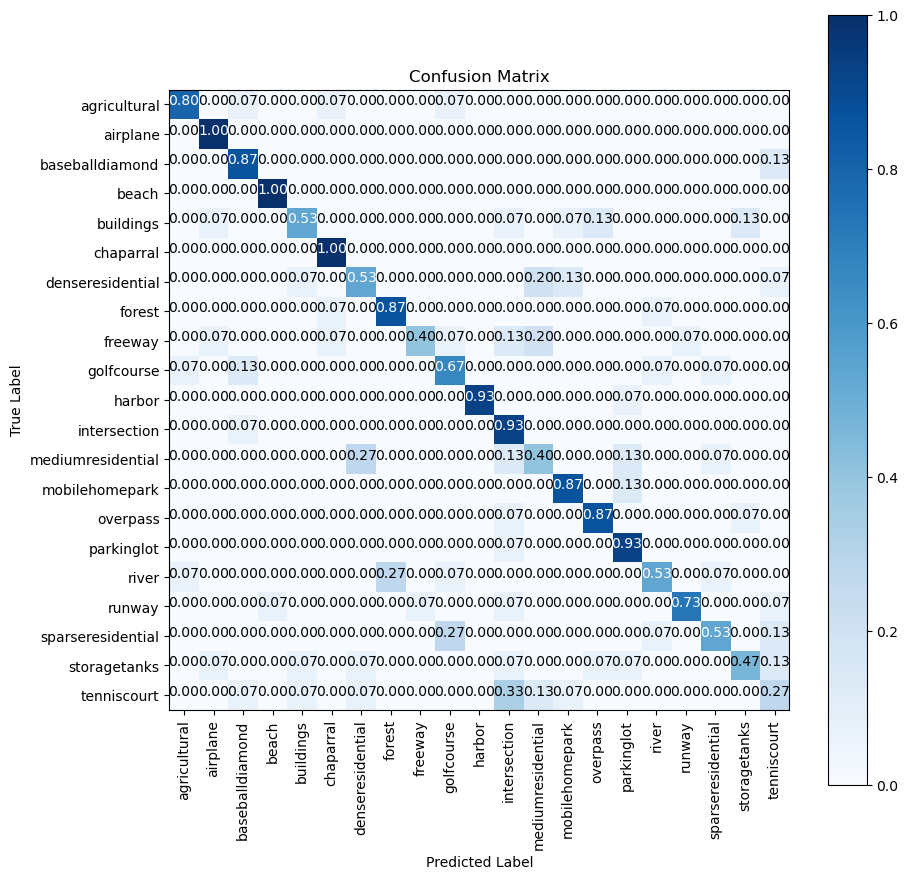

In [17]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import itertools

def plot_confusion_matrix(cm, classes, title='Confusion Matrix', cmap=plt.cm.Blues):
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]  # Normalize by row
    plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f'
    thresh = cm.max() / 2.0

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.grid(False)

# Predicting the classes for the test set
y_pred = model.predict(X_test)
y_pred_class = [np.argmax(y) for y in y_pred]  # Get the class with max probability

# Calculate confusion matrix
cnf_mat = confusion_matrix(y_test_class, y_pred_class)

# Set precision for printing
np.set_printoptions(precision=2)

# Plotting the confusion matrix
labels = list(test_generator.class_indices.keys())  # Assuming the labels are available from the generator
plt.figure()
plot_confusion_matrix(cnf_mat, classes=labels)
plt.show()


The model performance not good enough it has 72% accuracy and fail to predict in some class. For example in tenniscourt class the model only correctly predict 27% correctly only

Trying other models to improve accuracy

VGG16 with custom classification layers

In [18]:
import tensorflow as tf

conv_base = tf.keras.applications.VGG16(
    weights='imagenet',          
    include_top=False,           
    input_shape=(150, 150, 3)   
)

conv_base.trainable = False

conv_base.summary()


58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

Adding custom classification layers on top of VGG16 base

In [20]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint

for layer in conv_base.layers:
    layer.trainable = False

# Adding custom classification layers on top of the VGG16 base
top_model = conv_base.output
top_model = Flatten(name="flatten")(top_model)
top_model = Dense(4096, activation='relu')(top_model)
top_model = Dense(1072, activation='relu')(top_model)
top_model = Dropout(0.5)(top_model)
output_layer = Dense(21, activation='softmax')(top_model)  

model = Model(inputs=conv_base.input, outputs=output_layer)

model.compile(optimizer=Adam(learning_rate=2e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

history = model.fit(
    train_generator,
    epochs=100,
    validation_data=validation_generator,
    callbacks=[
        ModelCheckpoint(
            filepath='bestVGGmodel.keras',  # Save the best model in .keras format
            monitor='accuracy',
            mode='max',
            save_best_only=True,
            save_weights_only=False,
            verbose=1
        )
    ]
)


Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 4096)           │    33,558,528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 1072)           │     4,391,984 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 1072)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 21)             │        22,533 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 52,687,733 (200.99 MB)

 Trainable params: 37,973,045 (144.86 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

Epoch 1/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.1101 - loss: 3.0270
Epoch 1: accuracy improved from -inf to 0.20136, saving model to bestVGGmodel.keras
46/46 ━━━━━━━━━━━━━━━━━━━━ 69s 1s/step - accuracy: 0.1121 - loss: 3.0211 - val_accuracy: 0.6254 - val_loss: 2.0282
Epoch 2/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 973ms/step - accuracy: 0.4428 - loss: 2.0678
Epoch 2: accuracy improved from 0.20136 to 0.50340, saving model to bestVGGmodel.keras
46/46 ━━━━━━━━━━━━━━━━━━━━ 54s 1s/step - accuracy: 0.4441 - loss: 2.0642 - val_accuracy: 0.7365 - val_loss: 1.3895
Epoch 3/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 940ms/step - accuracy: 0.5697 - loss: 1.5270
Epoch 3: accuracy improved from 0.50340 to 0.58027, saving model to bestVGGmodel.keras
46/46 ━━━━━━━━━━━━━━━━━━━━ 52s 1s/step - accuracy: 0.5700 - loss: 1.5257 - val_accuracy: 0.7683 - val_loss: 1.0528
Epoch 4/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 956ms/step - accuracy: 0.6342 - loss: 1.2983
Epoch 4: accuracy improved from 0.58027 to 0.65782, 

Plotting VGG-16 Model accuracy and Loss

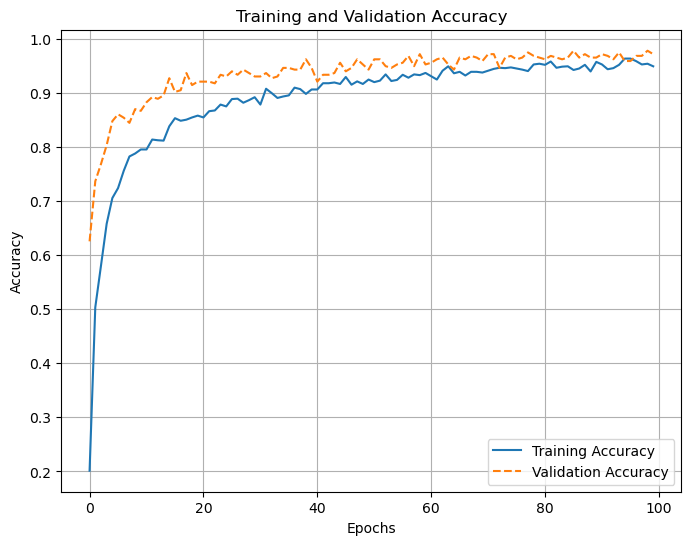

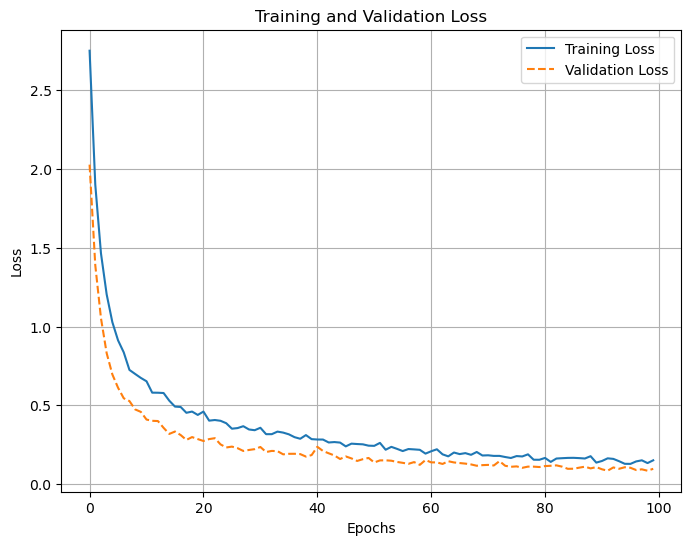

In [21]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.figure(figsize=(8, 6))
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy', linestyle='--')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 6))
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss', linestyle='--')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


This model looks pretty solid and also isn't overfit

Testing VGG-16

In [22]:
from sklearn.metrics import classification_report

model = tf.keras.models.load_model("bestVGGmodel.keras")

VGG16model = model.evaluate(test_generator)
print(f"Test Accuracy: {VGG16model[1]:.4f}")

y_pred = model.predict(X_test)
y_pred_class = [np.argmax(y) for y in y_pred]

print("Classification Report:")
print(classification_report(y_test_class, y_pred_class, target_names=labels))


315/315 ━━━━━━━━━━━━━━━━━━━━ 19s 58ms/step - accuracy: 0.9761 - loss: 0.0964
Test Accuracy: 0.9587
10/10 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step
Classification Report:
                   precision    recall  f1-score   support

     agricultural       0.94      1.00      0.97        15
         airplane       1.00      1.00      1.00        15
  baseballdiamond       0.94      1.00      0.97        15
            beach       1.00      1.00      1.00        15
        buildings       0.93      0.93      0.93        15
        chaparral       0.94      1.00      0.97        15
 denseresidential       0.93      0.87      0.90        15
           forest       0.93      0.87      0.90        15
          freeway       1.00      1.00      1.00        15
       golfcourse       0.93      0.93      0.93        15
           harbor       1.00      1.00      1.00        15
     intersection       1.00      1.00      1.00        15
mediumresidential       0.88      1.00      0.94        15
   mobilehom

Confusion Matrix for VGG-16 Model

10/10 ━━━━━━━━━━━━━━━━━━━━ 10s 930ms/step


<Figure size 640x480 with 0 Axes>

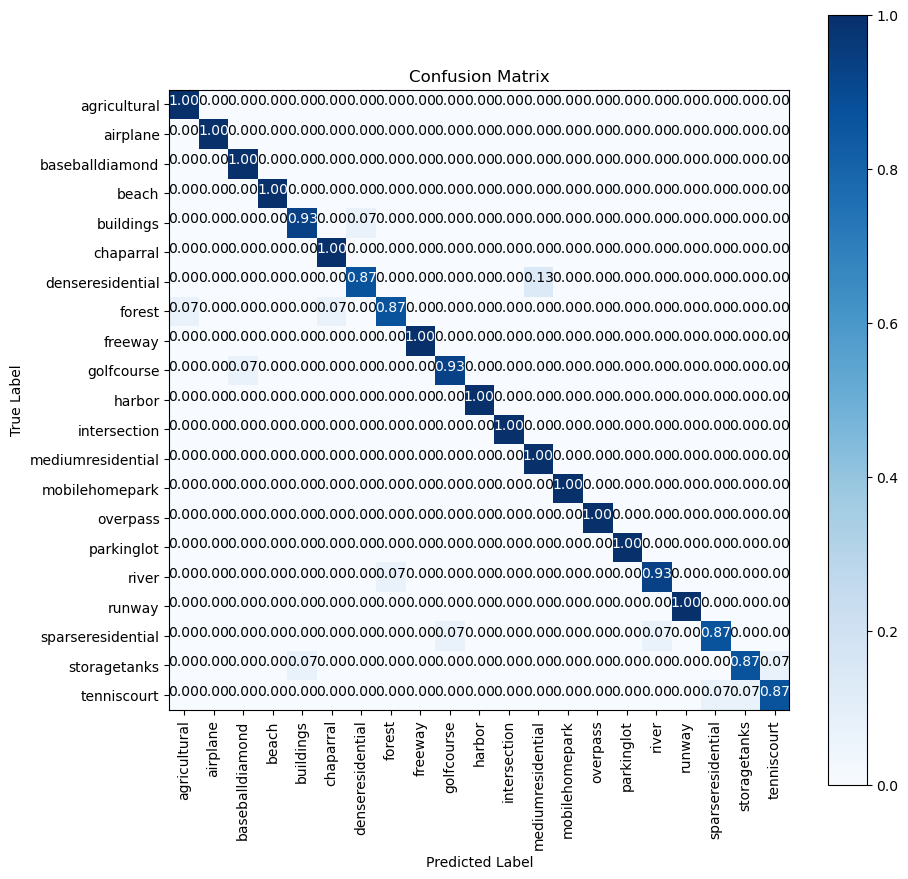

In [28]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import itertools

def plot_confusion_matrix(cm, classes, title='Confusion Matrix', cmap=plt.cm.Blues):
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] 
    plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f'
    thresh = cm.max() / 2.0

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.grid(False)

y_pred = model.predict(X_test)
y_pred_class = [np.argmax(y) for y in y_pred]  


cnf_mat = confusion_matrix(y_test_class, y_pred_class)

np.set_printoptions(precision=2)

labels = list(test_generator.class_indices.keys())  
plt.figure()
plot_confusion_matrix(cnf_mat, classes=labels)
plt.show()


The model performs good enough with 96% accuracy on the test set and successfully predict 100% on some classes

MobileNet Model with Custom classification layers at bottom

In [30]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint

mobile = MobileNet(weights="imagenet", include_top=False, input_shape=(150, 150, 3))

for layer in mobile.layers:
    layer.trainable = False

top_model = mobile.output
top_model = Flatten(name="flatten")(top_model)
top_model = Dense(4096, activation='relu')(top_model)
top_model = Dense(1072, activation='relu')(top_model)
top_model = Dropout(0.5)(top_model)
output_layer = Dense(21, activation='softmax')(top_model)  


model = Model(inputs=mobile.input, outputs=output_layer)

# Compile the model
model.compile(optimizer=Adam(learning_rate=2e-5),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

history = model.fit(
    train_generator,
    epochs=100,
    batch_size=32,
    validation_data=validation_generator,
    callbacks=[
        ModelCheckpoint(
            filepath='bestMobileNetmodel.keras',
            monitor='accuracy',
            mode='max',
            save_best_only=True,
            save_weights_only=False,
            verbose=1
        )
    ]
)


C:\Users\prath\AppData\Local\Temp\ipykernel_122044\245226003.py:7: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  mobile = MobileNet(weights="imagenet", include_top=False, input_shape=(150, 150, 3))


Model: "functional_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1 (Conv2D)                  │ (None, 75, 75, 32)     │           864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_bn (BatchNormalization)   │ (None, 75, 75, 32)     │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1_relu (ReLU)               │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1 (DepthwiseConv2D)     │ (None, 75, 75, 32)     │           288 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_bn                    │ (None, 75, 75, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_1_relu (ReLU)           │ (None, 75, 75, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1 (Conv2D)              │ (None, 75, 75, 64)     │         2,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_bn                    │ (None, 75, 75, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_1_relu (ReLU)           │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pad_2 (ZeroPadding2D)      │ (None, 76, 76, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2 (DepthwiseConv2D)     │ (None, 37, 37, 64)     │           576 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_bn                    │ (None, 37, 37, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_2_relu (ReLU)           │ (None, 37, 37, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2 (Conv2D)              │ (None, 37, 37, 128)    │         8,192 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_bn                    │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_2_relu (ReLU)           │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3 (DepthwiseConv2D)     │ (None, 37, 37, 128)    │         1,152 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_bn                    │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_dw_3_relu (ReLU)           │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3 (Conv2D)              │ (None, 37, 37, 128)    │        16,384 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv_pw_3_bn                    │ (None, 37, 37, 128)    │           512 │
│ (BatchNormalization)            │                        │             

 Total params: 74,756,341 (285.17 MB)

 Trainable params: 71,527,477 (272.86 MB)

 Non-trainable params: 3,228,864 (12.32 MB)

Epoch 1/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.1931 - loss: 3.5496
Epoch 1: accuracy improved from -inf to 0.34422, saving model to bestMobileNetmodel.keras
46/46 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.1963 - loss: 3.5286 - val_accuracy: 0.8095 - val_loss: 0.7337
Epoch 2/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 644ms/step - accuracy: 0.6918 - loss: 1.0155
Epoch 2: accuracy improved from 0.34422 to 0.71973, saving model to bestMobileNetmodel.keras
46/46 ━━━━━━━━━━━━━━━━━━━━ 37s 789ms/step - accuracy: 0.6924 - loss: 1.0137 - val_accuracy: 0.8667 - val_loss: 0.4099
Epoch 3/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 556ms/step - accuracy: 0.7724 - loss: 0.7217
Epoch 3: accuracy improved from 0.71973 to 0.78095, saving model to bestMobileNetmodel.keras
46/46 ━━━━━━━━━━━━━━━━━━━━ 30s 644ms/step - accuracy: 0.7726 - loss: 0.7216 - val_accuracy: 0.9079 - val_loss: 0.3025
Epoch 4/100
46/46 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step - accuracy: 0.8180 - loss: 0.6003
Epoch 4: accuracy improved f

Plotting MobileNet Model Accuracy and Loss

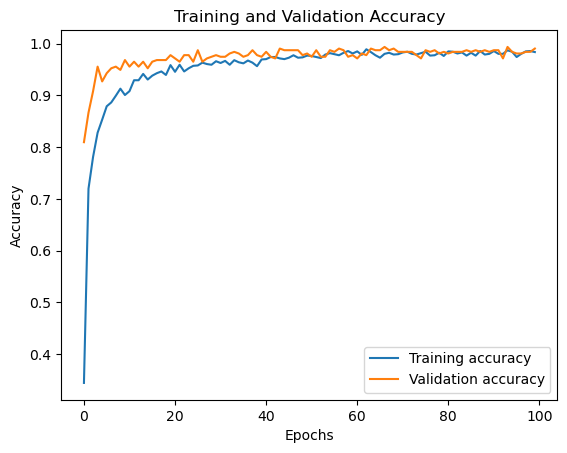

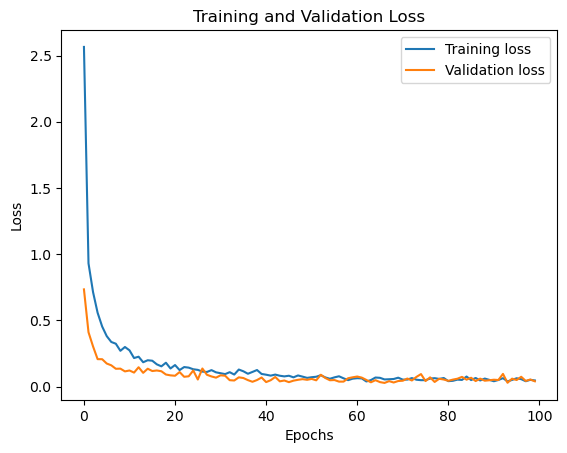

In [31]:
import matplotlib.pyplot as plt

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

plt.plot(acc, label='Training accuracy')
plt.plot(val_acc, label='Validation accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.plot(loss, label='Training loss')
plt.plot(val_loss, label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [32]:
from sklearn.metrics import classification_report
import numpy as np
import tensorflow as tf

model = tf.keras.models.load_model("bestMobileNetmodel.keras")

MobileNetmodel = model.evaluate(test_generator)
print(f"Test accuracy: {MobileNetmodel[1]}")

y_pred = model.predict(X_test)

y_pred_class = [np.argmax(y) for y in y_pred]

# Printing classification report
print(classification_report(y_test_class, y_pred_class))


315/315 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - accuracy: 0.9868 - loss: 0.0303
Test accuracy: 0.9841269850730896
10/10 ━━━━━━━━━━━━━━━━━━━━ 5s 203ms/step
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        15
           1       1.00      1.00      1.00        15
           2       1.00      1.00      1.00        15
           3       1.00      1.00      1.00        15
           4       1.00      0.93      0.97        15
           5       1.00      1.00      1.00        15
           6       0.93      0.87      0.90        15
           7       1.00      1.00      1.00        15
           8       1.00      1.00      1.00        15
           9       1.00      1.00      1.00        15
          10       1.00      1.00      1.00        15
          11       1.00      1.00      1.00        15
          12       0.88      1.00      0.94        15
          13       0.94      1.00      0.97        15
          14       1.00      1.00     

Confusion Matrix of MobileNet model

10/10 ━━━━━━━━━━━━━━━━━━━━ 1s 120ms/step


<Figure size 640x480 with 0 Axes>

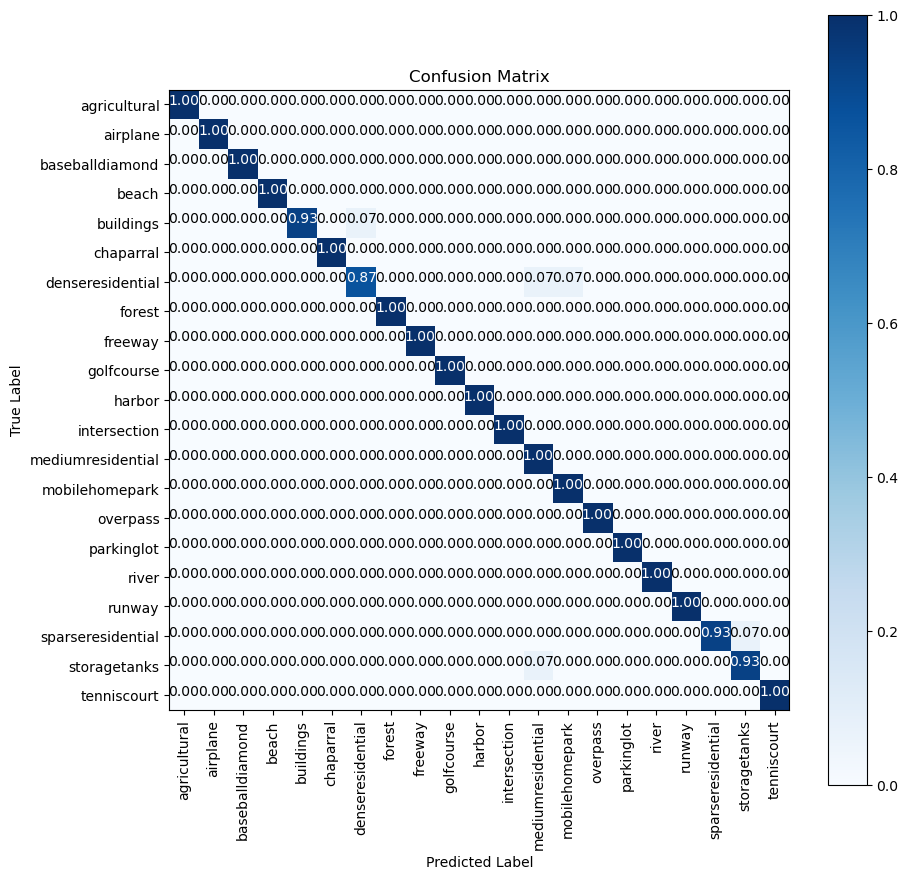

In [33]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
import itertools

def plot_confusion_matrix(cm, classes, title='Confusion Matrix', cmap=plt.cm.Blues):
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.figure(figsize=(10, 10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    fmt = '.2f'
    thresh = cm.max() / 2.0

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.grid(False)

y_pred = model.predict(X_test)
y_pred_class = [np.argmax(y) for y in y_pred]


cnf_mat = confusion_matrix(y_test_class, y_pred_class)

np.set_printoptions(precision=2)

labels = list(test_generator.class_indices.keys())
plt.figure()
plot_confusion_matrix(cnf_mat, classes=labels)
plt.show()


The model performs brilliantly with 98% accuracy on the test set and successfully predicts 100% on most classes and only fails to in 4 classes to predict 100% correctly

Robust testing of the best performing model with images from internet

In [7]:
from PIL import Image
import numpy as np
import tensorflow as tf

image_path = r'C:\Users\prath\Desktop\dl proj\Project\scientificProject\UCMerced_LandUse\airplane2.png'

img = Image.open(image_path)

img.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


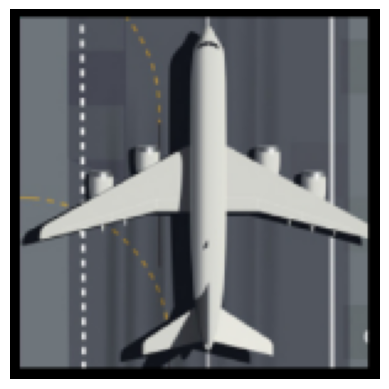

Predicted as: airplane


In [8]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

model = tf.keras.models.load_model("bestMobileNetmodel.keras")

class_labels = list(train_generator.class_indices.keys())

img = cv2.imread(image_path)
img = cv2.resize(img, (150, 150)) 
img = np.reshape(img, [1, 150, 150, 3])  

img_arr = np.zeros((1, 150, 150, 3))
img_arr[0, :, :, :] = img / 255.0  

y_pred = model.predict(img_arr)

img_to_show = cv2.cvtColor(img[0], cv2.COLOR_BGR2RGB) 
plt.imshow(img_to_show)
plt.axis('off')  # Hide axes
plt.show()


predicted_class = class_labels[np.argmax(y_pred)]
print(f"Predicted as: {predicted_class}")


This model correctly predicts image as an airplane indicating model is working showcasing a brilliant accuracy

In [14]:
from PIL import Image
import numpy as np
import tensorflow as tf

image_path = r'C:\Users\prath\Desktop\dl proj\Project\scientificProject\UCMerced_LandUse\airplane4.jpeg'

img = Image.open(image_path)

img.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 787ms/step


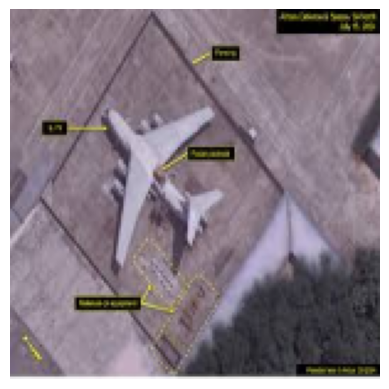

Predicted as: airplane


In [15]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

model = tf.keras.models.load_model("bestMobileNetmodel.keras")

class_labels = list(train_generator.class_indices.keys())

img = cv2.imread(image_path)
img = cv2.resize(img, (150, 150))
img = np.reshape(img, [1, 150, 150, 3])

img_arr = np.zeros((1, 150, 150, 3))
img_arr[0, :, :, :] = img / 255.0

y_pred = model.predict(img_arr)

img_to_show = cv2.cvtColor(img[0], cv2.COLOR_BGR2RGB)
plt.imshow(img_to_show)
plt.axis('off')  # Hide axes
plt.show()


predicted_class = class_labels[np.argmax(y_pred)]
print(f"Predicted as: {predicted_class}")


In [13]:
from PIL import Image
import numpy as np
import tensorflow as tf

image_path = r'C:\Users\prath\Desktop\dl proj\Project\scientificProject\UCMerced_LandUse\tenniscourt1.jpeg'

img = Image.open(image_path)

img.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


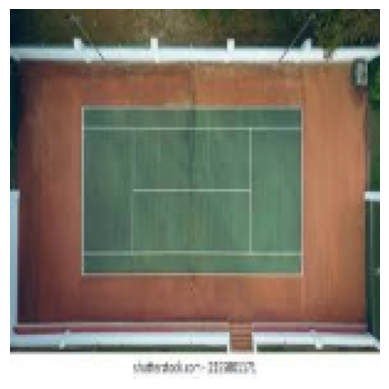

Predicted as: tenniscourt


In [14]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

model = tf.keras.models.load_model("bestMobileNetmodel.keras")

class_labels = list(train_generator.class_indices.keys())

img = cv2.imread(image_path)
img = cv2.resize(img, (150, 150))
img = np.reshape(img, [1, 150, 150, 3])

img_arr = np.zeros((1, 150, 150, 3))
img_arr[0, :, :, :] = img / 255.0

y_pred = model.predict(img_arr)

img_to_show = cv2.cvtColor(img[0], cv2.COLOR_BGR2RGB)
plt.imshow(img_to_show)
plt.axis('off')  # Hide axes
plt.show()


predicted_class = class_labels[np.argmax(y_pred)]
print(f"Predicted as: {predicted_class}")


Webpage to test images from net directly 

In [ ]:
from flask import Flask, request, render_template
import os
from werkzeug.utils import secure_filename
import tensorflow as tf
from tensorflow.keras.models import load_model
import numpy as np
from PIL import Image

# Path configuration
dataset_path = r"C:\Users\prath\Desktop\dl proj\Project\scientificProject\UCMerced_LandUse"
images_path = os.path.join(dataset_path, 'Images')

if not os.path.exists(images_path):
    raise FileNotFoundError(f"Dataset path not found: {images_path}")

MODEL_PATH = 'bestMobileNetmodel.keras'
if not os.path.exists(MODEL_PATH):
    raise FileNotFoundError(f"Model file not found: {MODEL_PATH}")

# Load model and class names
try:
    model = load_model(MODEL_PATH)
    print("Model loaded successfully.")
except Exception as e:
    raise RuntimeError(f"Failed to load the model: {str(e)}")

class_names = os.listdir(images_path)

# Flask app setup
app = Flask(__name__)
UPLOAD_FOLDER = 'uploads/'
os.makedirs(UPLOAD_FOLDER, exist_ok=True)
app.config['UPLOAD_FOLDER'] = UPLOAD_FOLDER

ALLOWED_EXTENSIONS = {'png', 'jpg', 'jpeg'}

def allowed_file(filename):
    return '.' in filename and filename.rsplit('.', 1)[1].lower() in ALLOWED_EXTENSIONS

# Route to the home page
@app.route('/')
def home():
    return render_template('index.html', result=None)

# Route for prediction
@app.route('/predict', methods=['POST'])
def predict():
    if 'file' not in request.files:
        return render_template('index.html', result="No file uploaded.")

    file = request.files['file']
    if file.filename == '':
        return render_template('index.html', result="No file selected.")

    if allowed_file(file.filename):
        filename = secure_filename(file.filename)
        filepath = os.path.join(app.config['UPLOAD_FOLDER'], filename)
        file.save(filepath)

        # Preprocess the image
        try:
            img = Image.open(filepath)

            # Convert RGBA to RGB if needed
            if img.mode == 'RGBA':
                img = img.convert('RGB')

            img = img.resize((150, 150))
            img_array = np.expand_dims(np.array(img) / 255.0, axis=0)

            # Predict using the model
            predictions = model.predict(img_array)
            predicted_class = class_names[np.argmax(predictions)]

            # Return result
            return render_template('index.html', result=predicted_class)
        except Exception as e:
            return render_template('index.html', result=f"Error processing image: {str(e)}")
    else:
        return render_template('index.html', result="Invalid file type.")

if __name__ == '__main__':
    app.run(debug=False)